In [6]:
import h5py
import matplotlib.pyplot as plt
import numpy as np
from enum import Enum
import collections
from pylab import meshgrid
import os


%matplotlib inline


        
class FIELD(Enum):
        ELECTRIC = [1,['0_2'],[r'$E_z$']]
        CURRENT = [1,[ '1_2'],[ r'$J_z$']]
        MAGNETIC = [1,[ '8_1'],[ r'$B_y$']]
        



                    
def loadData(fileName):           
        f = h5py.File(fileName, 'r')
        allData = collections.defaultdict(lambda: np.ndarray(0))
        for fld in UFIELD:
                VAR0_name = 'vars/'+fld.value[1][0]
                SHAPE = f[VAR0_name].shape            
                Lx=SHAPE[0]
                Ly=SHAPE[1]
                Lz=SHAPE[2]
                data = np.zeros([Lx, Ly, Lz,  6])
                idx = 0
                for field in fld.value[1]:
                    VAR_name = 'vars/'+field
                    data[...,idx] = f[VAR_name][...]
                    idx += 1
                    allData[fld] = data                   
        f.close()
        return allData
        
        
def loadVar(fileName, fld):           
        f = h5py.File(fileName, 'r')
        allData = collections.defaultdict(lambda: np.ndarray(0))
        VAR0_name = 'vars/'+fld.value[1][0]
        SHAPE = f[VAR0_name].shape    
        Lx=SHAPE[0]
        Ly=SHAPE[1]
        Lz=SHAPE[2]
        data = np.zeros([Lx, Ly, Lz, len(fld.value[1])])
        idx = 0
        for field in fld.value[1]:
            VAR_name = 'vars/'+field
            data[...,idx] = f[VAR_name]
            idx += 1
            
        f.close()
        return data
    
def loadVarComp(fileName, fld, comp):           
        f = h5py.File(fileName, 'r')
        allData = collections.defaultdict(lambda: np.ndarray(0))
        VAR0_name = 'vars/'+fld.value[1][0]
        SHAPE = f[VAR0_name].shape    
        Lx=SHAPE[0]
        Ly=SHAPE[1]
        Lz=SHAPE[2]
        data = np.zeros([Lx, Ly, Lz])
        VAR_name = 'vars/'+fld.value[1][comp]
        data[...] = f[VAR_name]
            
        f.close()
        return data
    

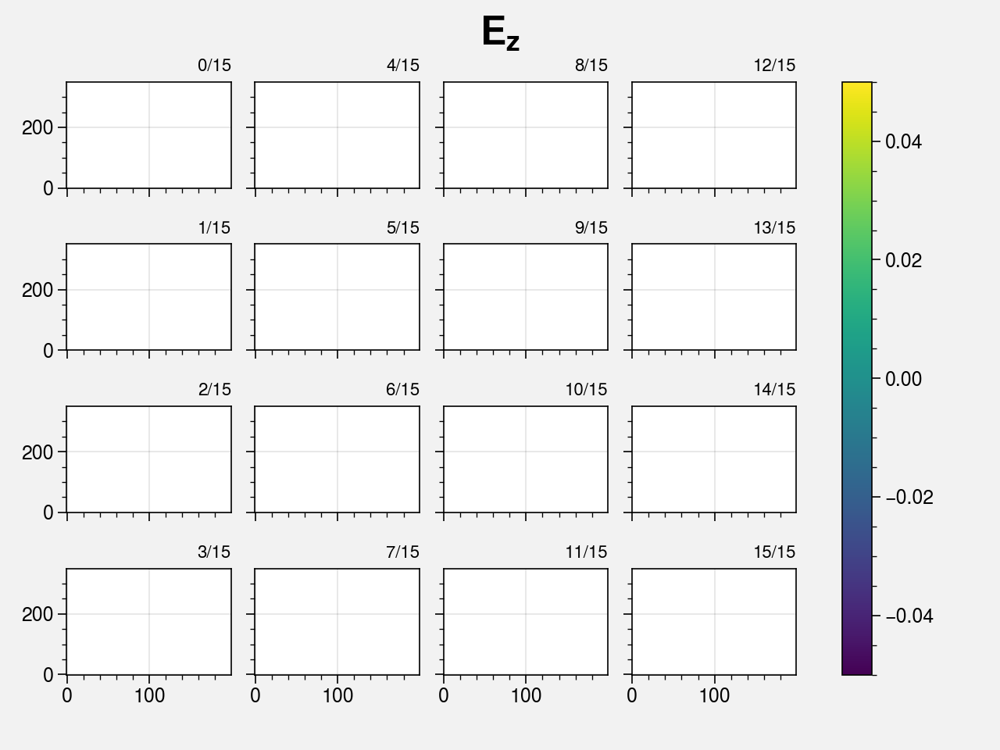

In [9]:
#goal was a 4x4 grid, with 16 boxes, each box displaying a video (going through the 175 frames of the z direction)    
#BUT code doesn't stop running, so needs optimization. I for myself can't see how to improve this even further beyond,
#as the animation module
#is already one of if not the fastest.
#the display is working to some extent, but it keeps switching boxes (indexed from 0 to 15), can't figure out why
#the goal is for the 16 animations to be running at the same time

from celluloid import Camera # getting the camera
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML # to show the animation in Jupyter
import os

col=['viridis', 'plasma', 'inferno']

fld=FIELD.ELECTRIC

fig,axis = plt.subplots(4, 4, sharex=True, sharey=True)
title = fld.value[2][0]
fig.suptitle( str(title) , fontsize=18)
camera = Camera(fig)# the camera gets the fig we'll plot
for field in fld.value[1]:
    for filename in os.listdir():
        if filename.endswith(".h5"):
            numfr = str(filename.split('.')[0].split('_')[2])
    
            data2Plt = loadVarComp(filename, fld, 0)
            [lx, ly, lz] = data2Plt.shape
            vmax = 0.05
            x=int(numfr)%4
            y=int((int(numfr)-x)/4)
            for i in range(0,175,5):
                c=axis[x,y].imshow( np.transpose(data2Plt[...,i]),
                        origin = 'lower', vmin = -vmax, vmax = vmax,
                        interpolation='bicubic', cmap=col[0])
                axis[x,y].set_aspect('auto')
                axis[x,y].set_title(str(numfr)+'/15', loc='right', fontsize=8)
                camera.snap() # the camera takes a snapshot of the plot
                
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

fig.colorbar(c, ax=axis)
    

animation = camera.animate() # animation ready
#animation.save('Frame '+str(numfr)+" 8_1.mp4")
HTML(animation.to_html5_video()) # displaying the animation